### Import Libraries

In [843]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

### Load the Images

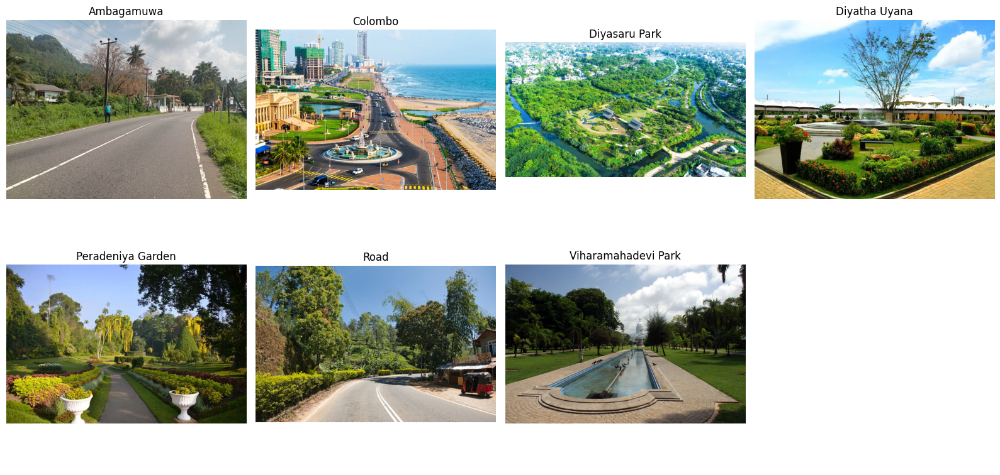

In [844]:
# Load images
image_1 = cv2.imread("input_img/ambagamuwa.jpg")
image_2 = cv2.imread("input_img/colombo.avif")
image_3 = cv2.imread("input_img/Diyasaru_Park.webp")
image_4 = cv2.imread("input_img/Diyatha_Uyana.webp")
image_5 = cv2.imread("input_img/peradeniya_garden.webp")
image_6 = cv2.imread("input_img/road.jpeg")
image_7 = cv2.imread("input_img/Viharamahadevi_Park.jpg")

# Convert BGR to RGB
image_rgb_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB)
image_rgb_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)
image_rgb_3 = cv2.cvtColor(image_3, cv2.COLOR_BGR2RGB)
image_rgb_4 = cv2.cvtColor(image_4, cv2.COLOR_BGR2RGB)
image_rgb_5 = cv2.cvtColor(image_5, cv2.COLOR_BGR2RGB)
image_rgb_6 = cv2.cvtColor(image_6, cv2.COLOR_BGR2RGB)
image_rgb_7 = cv2.cvtColor(image_7, cv2.COLOR_BGR2RGB)

# Display original images in a grid
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

images_list = [image_rgb_1, image_rgb_2, image_rgb_3, image_rgb_4, image_rgb_5, image_rgb_6, image_rgb_7]
titles = ["Ambagamuwa", "Colombo", "Diyasaru Park", "Diyatha Uyana", "Peradeniya Garden", "Road", "Viharamahadevi Park"]

for i in range(7):
	axes[i].imshow(images_list[i])
	axes[i].set_title(titles[i])
	axes[i].axis("off")

# Hide the last subplot since we only have 7 images
axes[7].axis("off")

plt.tight_layout()
plt.show()

### Convert RGB → Lab Color Space

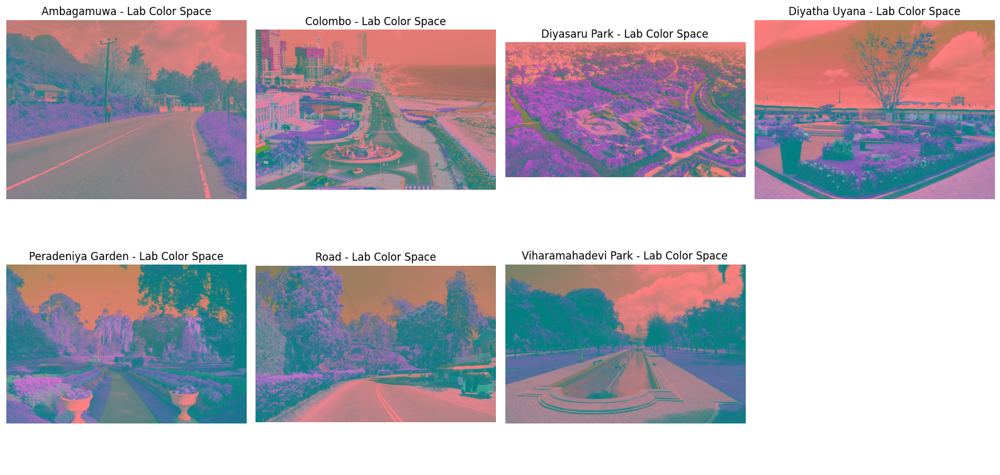

In [845]:
# Convert RGB to Lab
image_lab_1 = cv2.cvtColor(image_rgb_1, cv2.COLOR_RGB2LAB)
image_lab_2 = cv2.cvtColor(image_rgb_2, cv2.COLOR_RGB2LAB)
image_lab_3 = cv2.cvtColor(image_rgb_3, cv2.COLOR_RGB2LAB)
image_lab_4 = cv2.cvtColor(image_rgb_4, cv2.COLOR_RGB2LAB)
image_lab_5 = cv2.cvtColor(image_rgb_5, cv2.COLOR_RGB2LAB)
image_lab_6 = cv2.cvtColor(image_rgb_6, cv2.COLOR_RGB2LAB)
image_lab_7 = cv2.cvtColor(image_rgb_7, cv2.COLOR_RGB2LAB)

# Create list of Lab images for easier iteration
images_lab_list = [image_lab_1, image_lab_2, image_lab_3, image_lab_4, image_lab_5, image_lab_6, image_lab_7]

# Display images in Lab color space
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for i in range(7):
    axes[i].imshow(images_lab_list[i])
    axes[i].set_title(f"{titles[i]} - Lab Color Space")
    axes[i].axis("off")

# Hide the last subplot
axes[7].axis("off")

plt.tight_layout()
plt.show()

### Reshape Image for K-Means

In [846]:
# Reshape image into a 2D array of pixels
pixel_values_1 = image_lab_1.reshape((-1, 3))

# Convert to float
pixel_values_1 = np.float32(pixel_values_1)

### Apply K-Means Clustering

In [847]:
# Define number of clusters
K = 3

# Apply K-Means
kmeans_1 = KMeans(n_clusters=K, random_state=42)
labels_1 = kmeans_1.fit_predict(pixel_values_1)

# Get cluster centers
centers_1 = np.uint8(kmeans_1.cluster_centers_)

In [848]:
# Define number of clusters
K = 4

# Apply K-Means
kmeans_1 = KMeans(n_clusters=K, random_state=42)
labels_1 = kmeans_1.fit_predict(pixel_values_1)

# Get cluster centers
centers_1 = np.uint8(kmeans_1.cluster_centers_)


In [849]:
# Define number of clusters
K = 5

# Apply K-Means
kmeans_1 = KMeans(n_clusters=K, random_state=42)
labels_1 = kmeans_1.fit_predict(pixel_values_1)

# Get cluster centers
centers_1 = np.uint8(kmeans_1.cluster_centers_)


### Pixel Distribution

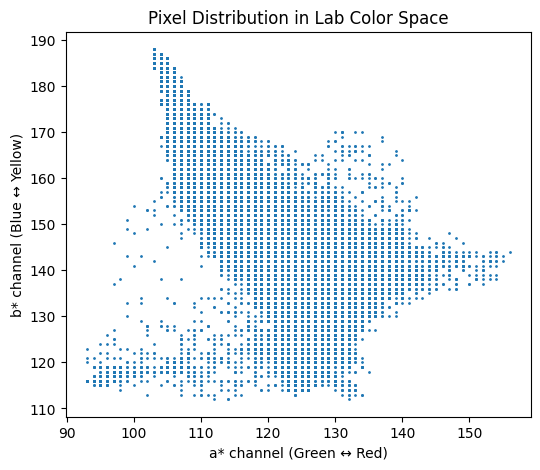

In [850]:
# Distribution of a* and b* channels (Lab color space)
a_channel = pixel_values_1[:,1]
b_channel = pixel_values_1[:,2]

plt.figure(figsize=(6,5))
plt.scatter(a_channel, b_channel, s=1)
plt.xlabel("a* channel (Green ↔ Red)")
plt.ylabel("b* channel (Blue ↔ Yellow)")
plt.title("Pixel Distribution in Lab Color Space")
plt.show()


### Elbow Method (K = 3, 4, 5)

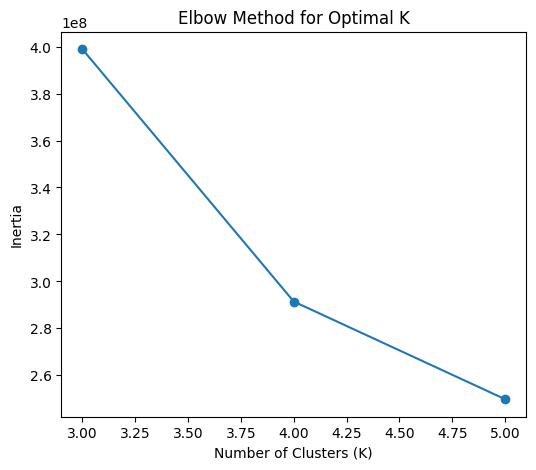

In [851]:
inertia_values_1 = []
K_values_1 = [3, 4, 5]

for k in K_values_1:
    kmeans_1 = KMeans(n_clusters=k, random_state=42)
    kmeans_1.fit(pixel_values_1)
    inertia_values_1.append(kmeans_1.inertia_)

plt.figure(figsize=(6,5))
plt.plot(K_values_1, inertia_values_1, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal K")
plt.show()


### Silhouette Score (K = 3, 4, 5)

K = 3, Silhouette Score = 0.5421
K = 4, Silhouette Score = 0.4959
K = 5, Silhouette Score = 0.4522


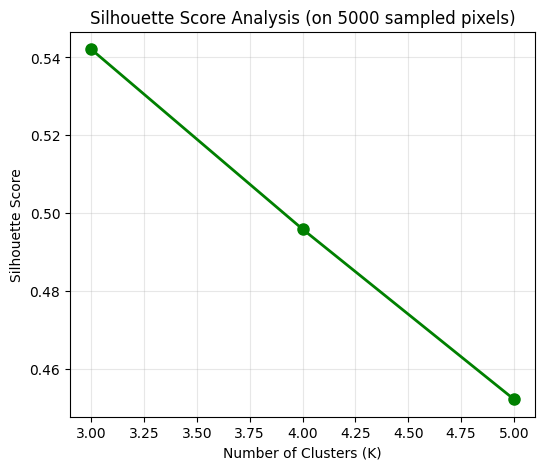

In [852]:
# Sample pixels for faster computation (silhouette score is O(n²) complexity)
sample_size = min(5000, len(pixel_values_1))  # Use 5000 pixels for speed
sample_indices = np.random.choice(len(pixel_values_1), sample_size, replace=False)
pixel_sample = pixel_values_1[sample_indices]

silhouette_scores_1 = []

for k in K_values_1:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pixel_sample)
    score = silhouette_score(pixel_sample, labels)
    silhouette_scores_1.append(score)
    print(f"K = {k}, Silhouette Score = {score:.4f}")

plt.figure(figsize=(6,5))
plt.plot(K_values_1, silhouette_scores_1, marker='o', color='green', linewidth=2, markersize=8)
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score Analysis (on 5000 sampled pixels)")
plt.grid(True, alpha=0.3)
plt.show()

### Summary Table

In [853]:
results = pd.DataFrame({
    "K": K_values_1,
    "Inertia": inertia_values_1,
    "Silhouette Score": silhouette_scores_1
})

results

,K,Inertia,Silhouette Score
0,3,398873664.0,0.542102
1,4,291412288.0,0.495898
2,5,249819856.0,0.452204


### Create Segmented Images

In [854]:
# best K is 4 based on silhouette score
K_optimal = 4
kmeans_opt = KMeans(n_clusters=K_optimal, random_state=42)
labels_opt = kmeans_opt.fit_predict(pixel_values_1)   # pixel_values from Lab image
centers_opt = np.uint8(kmeans_opt.cluster_centers_)

# Map labels to colors
segmented_image_opt = centers_opt[labels_opt]

# Reshape back to original image shape
segmented_image_opt = segmented_image_opt.reshape(image_lab_1.shape)

# Convert Lab back to RGB
segmented_rgb_opt = cv2.cvtColor(np.uint8(segmented_image_opt), cv2.COLOR_LAB2RGB)

### Display Original vs Segmented Image

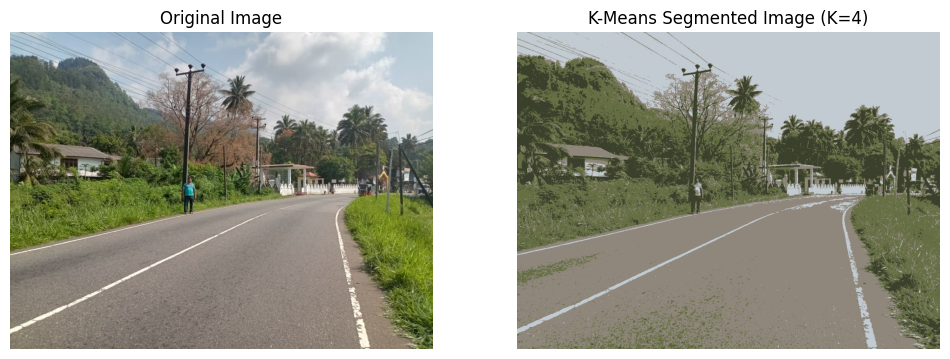

In [855]:
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(image_rgb_1)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(segmented_rgb_opt)
plt.title("K-Means Segmented Image (K=4)")
plt.axis("off")

plt.show()


### Save segmented image

In [856]:
# Save segmented image
cv2.imwrite("output_img/segmented_ambagamuwa_k4.jpg", cv2.cvtColor(segmented_rgb_opt, cv2.COLOR_RGB2BGR))

True

### Extract Greenery Cluster

In [857]:
# Convert centers to RGB for analysis
centers_rgb = cv2.cvtColor(centers_1.reshape(1, -1, 3), cv2.COLOR_LAB2RGB)
centers_rgb = centers_rgb.reshape(-1, 3)

print("Cluster Centers (RGB):")
for i, c in enumerate(centers_rgb):
    print(f"Cluster {i}: {c}")


Cluster Centers (RGB):
Cluster 0: [137 129 120]
Cluster 1: [68 72 51]
Cluster 2: [172 182 189]
Cluster 3: [107 125  51]
Cluster 4: [207 215 219]


### Mask Green Cluster

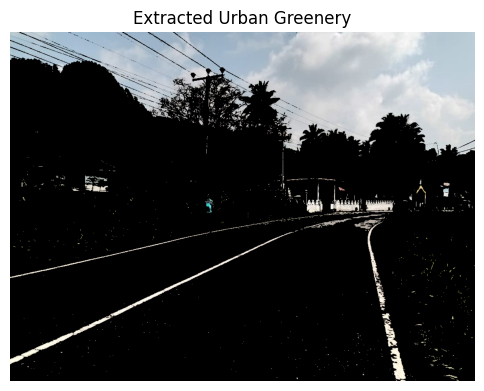

In [858]:
# Create mask for greenery cluster
green_cluster = 2  # change based on visual inspection
mask = (labels_opt == green_cluster)

# Create greenery image
greenery = np.zeros_like(image_rgb_1)
greenery.reshape((-1,3))[mask] = image_rgb_1.reshape((-1,3))[mask]

plt.figure(figsize=(6,6))
plt.imshow(greenery)
plt.title("Extracted Urban Greenery")
plt.axis("off")
plt.show()


In [859]:
# Reshape image into a 2D array of pixels
pixel_values_2 = image_lab_2.reshape((-1, 3))

# Convert to float
pixel_values_2 = np.float32(pixel_values_2)

In [860]:
# Define number of clusters
K = 3

# Apply K-Means
kmeans_2 = KMeans(n_clusters=K, random_state=42)
labels_2 = kmeans_2.fit_predict(pixel_values_2)

# Get cluster centers
centers_2 = np.uint8(kmeans_2.cluster_centers_)

In [861]:
# Define number of clusters
K = 4

# Apply K-Means
kmeans_2 = KMeans(n_clusters=K, random_state=42)
labels_2 = kmeans_2.fit_predict(pixel_values_2)

# Get cluster centers
centers_2 = np.uint8(kmeans_2.cluster_centers_)

In [862]:
# Define number of clusters
K = 5

# Apply K-Means
kmeans_2 = KMeans(n_clusters=K, random_state=42)
labels_2 = kmeans_2.fit_predict(pixel_values_2)

# Get cluster centers
centers_2 = np.uint8(kmeans_2.cluster_centers_)

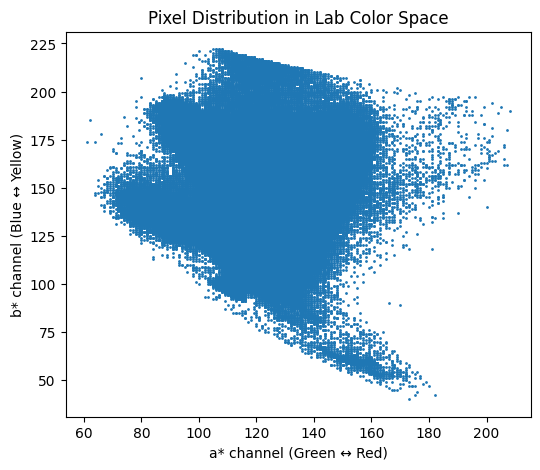

In [863]:
# Distribution of a* and b* channels (Lab color space)
a_channel = pixel_values_2[:,1]
b_channel = pixel_values_2[:,2]

plt.figure(figsize=(6,5))
plt.scatter(a_channel, b_channel, s=1)
plt.xlabel("a* channel (Green ↔ Red)")
plt.ylabel("b* channel (Blue ↔ Yellow)")
plt.title("Pixel Distribution in Lab Color Space")
plt.show()


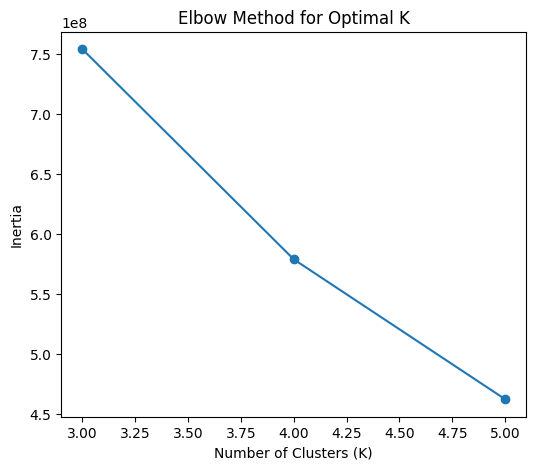

In [864]:
inertia_values_2 = []
K_values_2 = [3, 4, 5]

for k in K_values_2:
    kmeans_2 = KMeans(n_clusters=k, random_state=42)
    kmeans_2.fit(pixel_values_2)
    inertia_values_2.append(kmeans_2.inertia_)

plt.figure(figsize=(6,5))
plt.plot(K_values_2, inertia_values_2, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal K")
plt.show()


K = 3, Silhouette Score = 0.4344
K = 4, Silhouette Score = 0.4685
K = 5, Silhouette Score = 0.4154


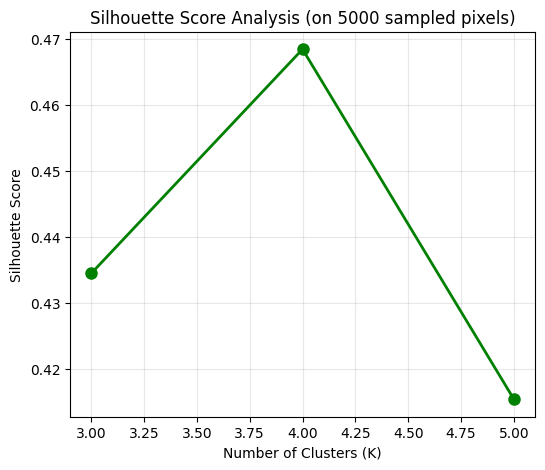

In [865]:
# Sample pixels for faster computation (silhouette score is O(n²) complexity)
sample_size = min(5000, len(pixel_values_2))  # Use 5000 pixels for speed
sample_indices = np.random.choice(len(pixel_values_2), sample_size, replace=False)
pixel_sample = pixel_values_2[sample_indices]

silhouette_scores_2 = []

for k in K_values_2:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pixel_sample)
    score = silhouette_score(pixel_sample, labels)
    silhouette_scores_2.append(score)
    print(f"K = {k}, Silhouette Score = {score:.4f}")

plt.figure(figsize=(6,5))
plt.plot(K_values_2, silhouette_scores_2, marker='o', color='green', linewidth=2, markersize=8)
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score Analysis (on 5000 sampled pixels)")
plt.grid(True, alpha=0.3)
plt.show()

In [866]:
results = pd.DataFrame({
    "K": K_values_2,
    "Inertia": inertia_values_2,
    "Silhouette Score": silhouette_scores_2
})

results

,K,Inertia,Silhouette Score
0,3,753866112.0,0.434442
1,4,578834176.0,0.468453
2,5,462321248.0,0.415369


In [867]:
# best K is 4 based on silhouette score
K_optimal = 4
kmeans_opt = KMeans(n_clusters=K_optimal, random_state=42)
labels_opt = kmeans_opt.fit_predict(pixel_values_2)   # pixel_values from Lab image
centers_opt = np.uint8(kmeans_opt.cluster_centers_)

# Map labels to colors
segmented_image_opt = centers_opt[labels_opt]

# Reshape back to original image shape
segmented_image_opt = segmented_image_opt.reshape(image_lab_2.shape)

# Convert Lab back to RGB
segmented_rgb_opt = cv2.cvtColor(np.uint8(segmented_image_opt), cv2.COLOR_LAB2RGB)

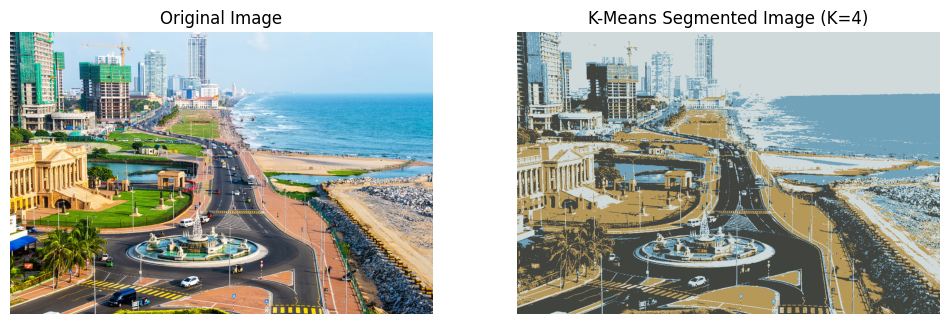

In [868]:
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(image_rgb_2)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(segmented_rgb_opt)
plt.title("K-Means Segmented Image (K=4)")
plt.axis("off")

plt.show()


In [869]:
# Save segmented image
cv2.imwrite("output_img/segmented_colombo_k4.jpg", cv2.cvtColor(segmented_rgb_opt, cv2.COLOR_RGB2BGR))

True

In [870]:
# Convert centers to RGB for analysis
centers_rgb = cv2.cvtColor(centers_2.reshape(1, -1, 3), cv2.COLOR_LAB2RGB)
centers_rgb = centers_rgb.reshape(-1, 3)

print("Cluster Centers (RGB):")
for i, c in enumerate(centers_rgb):
    print(f"Cluster {i}: {c}")


Cluster Centers (RGB):
Cluster 0: [113 169 193]
Cluster 1: [90 90 81]
Cluster 2: [190 158  95]
Cluster 3: [40 45 45]
Cluster 4: [209 219 221]


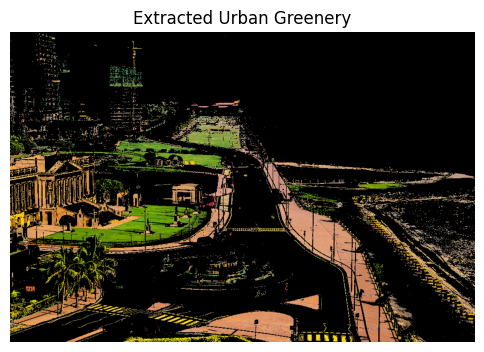

In [871]:
# Create mask for greenery cluster
green_cluster = 2  # change based on visual inspection
mask = (labels_opt == green_cluster)

# Create greenery image
greenery = np.zeros_like(image_rgb_2)
greenery.reshape((-1,3))[mask] = image_rgb_2.reshape((-1,3))[mask]

plt.figure(figsize=(6,6))
plt.imshow(greenery)
plt.title("Extracted Urban Greenery")
plt.axis("off")
plt.show()


In [872]:
# Reshape image into a 2D array of pixels
pixel_values_3 = image_lab_3.reshape((-1, 3))

# Convert to float
pixel_values_3 = np.float32(pixel_values_3)

In [873]:
# Define number of clusters
K = 3

# Apply K-Means
kmeans_3 = KMeans(n_clusters=K, random_state=42)
labels_3 = kmeans_3.fit_predict(pixel_values_3)

# Get cluster centers
centers_3 = np.uint8(kmeans_3.cluster_centers_)

In [874]:
# Define number of clusters
K = 4

# Apply K-Means
kmeans_3 = KMeans(n_clusters=K, random_state=42)
labels_3 = kmeans_3.fit_predict(pixel_values_3)

# Get cluster centers
centers_3 = np.uint8(kmeans_3.cluster_centers_)

In [875]:
# Define number of clusters
K = 5

# Apply K-Means
kmeans_3 = KMeans(n_clusters=K, random_state=42)
labels_3 = kmeans_3.fit_predict(pixel_values_3)

# Get cluster centers
centers_3 = np.uint8(kmeans_3.cluster_centers_)

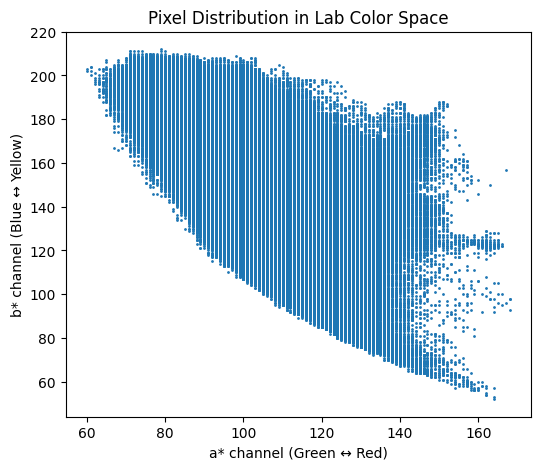

In [876]:
# Distribution of a* and b* channels (Lab color space)
a_channel = pixel_values_3[:,1]
b_channel = pixel_values_3[:,2]

plt.figure(figsize=(6,5))
plt.scatter(a_channel, b_channel, s=1)
plt.xlabel("a* channel (Green ↔ Red)")
plt.ylabel("b* channel (Blue ↔ Yellow)")
plt.title("Pixel Distribution in Lab Color Space")
plt.show()


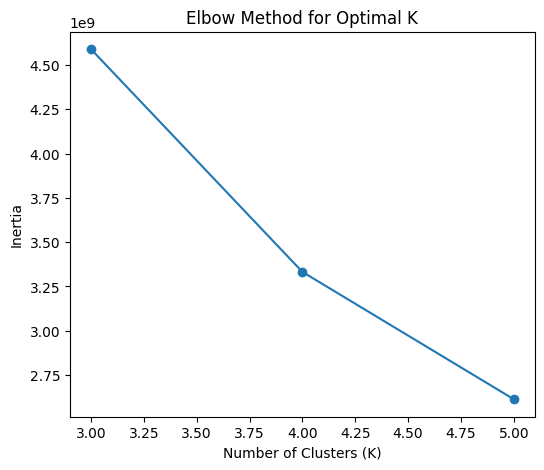

In [877]:
inertia_values_3 = []
K_values_3 = [3, 4, 5]

for k in K_values_3:
    kmeans_3 = KMeans(n_clusters=k, random_state=42)
    kmeans_3.fit(pixel_values_3)
    inertia_values_3.append(kmeans_3.inertia_)

plt.figure(figsize=(6,5))
plt.plot(K_values_3, inertia_values_3, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal K")
plt.show()


K = 3, Silhouette Score = 0.4283
K = 4, Silhouette Score = 0.3941
K = 5, Silhouette Score = 0.4141


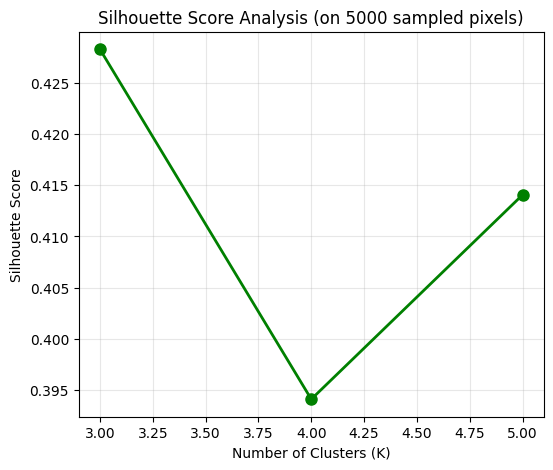

In [878]:
# Sample pixels for faster computation (silhouette score is O(n²) complexity)
sample_size = min(5000, len(pixel_values_3))  # Use 5000 pixels for speed
sample_indices = np.random.choice(len(pixel_values_3), sample_size, replace=False)
pixel_sample = pixel_values_3[sample_indices]

silhouette_scores_3 = []

for k in K_values_3:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pixel_sample)
    score = silhouette_score(pixel_sample, labels)
    silhouette_scores_3.append(score)
    print(f"K = {k}, Silhouette Score = {score:.4f}")

plt.figure(figsize=(6,5))
plt.plot(K_values_3, silhouette_scores_3, marker='o', color='green', linewidth=2, markersize=8)
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score Analysis (on 5000 sampled pixels)")
plt.grid(True, alpha=0.3)
plt.show()

In [879]:
results = pd.DataFrame({
    "K": K_values_3,
    "Inertia": inertia_values_3,
    "Silhouette Score": silhouette_scores_3
})

results

,K,Inertia,Silhouette Score
0,3,4.588876e+09,0.428279
1,4,3.331951e+09,0.394106
2,5,2.613272e+09,0.414067


In [880]:
# best K is 4 based on silhouette score
K_optimal = 4
kmeans_opt = KMeans(n_clusters=K_optimal, random_state=42)
labels_opt = kmeans_opt.fit_predict(pixel_values_3)   # pixel_values from Lab image
centers_opt = np.uint8(kmeans_opt.cluster_centers_)

# Map labels to colors
segmented_image_opt = centers_opt[labels_opt]

# Reshape back to original image shape
segmented_image_opt = segmented_image_opt.reshape(image_lab_3.shape)

# Convert Lab back to RGB
segmented_rgb_opt = cv2.cvtColor(np.uint8(segmented_image_opt), cv2.COLOR_LAB2RGB)

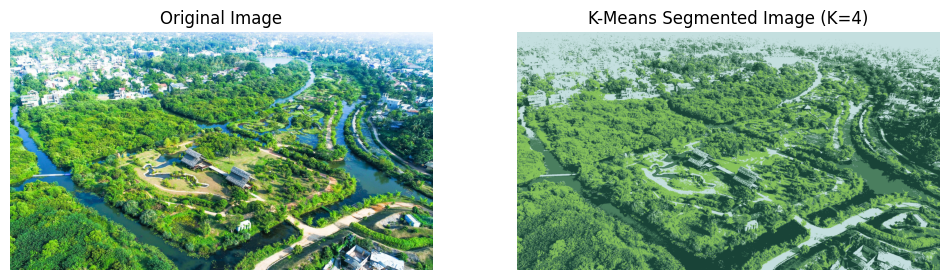

In [881]:
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(image_rgb_3)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(segmented_rgb_opt)
plt.title("K-Means Segmented Image (K=4)")
plt.axis("off")

plt.show()


In [882]:
# Save segmented image
cv2.imwrite("output_img/segmented_diyasaru_park_k4.jpg", cv2.cvtColor(segmented_rgb_opt, cv2.COLOR_RGB2BGR))

True

In [883]:
# Convert centers to RGB for analysis
centers_rgb = cv2.cvtColor(centers_3.reshape(1, -1, 3), cv2.COLOR_LAB2RGB)
centers_rgb = centers_rgb.reshape(-1, 3)

print("Cluster Centers (RGB):")
for i, c in enumerate(centers_rgb):
    print(f"Cluster {i}: {c}")


Cluster Centers (RGB):
Cluster 0: [25 67 55]
Cluster 1: [141 198  96]
Cluster 2: [204 227 226]
Cluster 3: [ 68 125  55]
Cluster 4: [ 79 139 157]


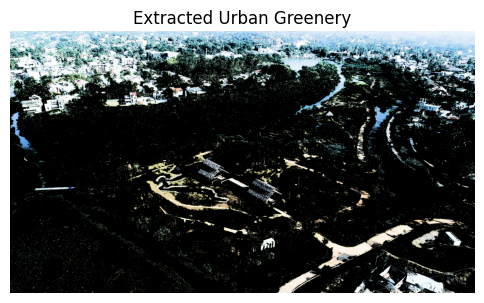

In [884]:
# Create mask for greenery cluster
green_cluster = 2  # change based on visual inspection
mask = (labels_opt == green_cluster)

# Create greenery image
greenery = np.zeros_like(image_rgb_3)
greenery.reshape((-1,3))[mask] = image_rgb_3.reshape((-1,3))[mask]

plt.figure(figsize=(6,6))
plt.imshow(greenery)
plt.title("Extracted Urban Greenery")
plt.axis("off")
plt.show()


In [885]:
# Reshape image into a 2D array of pixels
pixel_values_4 = image_lab_4.reshape((-1, 3))

# Convert to float
pixel_values_4 = np.float32(pixel_values_4)

In [886]:
# Define number of clusters
K = 3

# Apply K-Means
kmeans_4 = KMeans(n_clusters=K, random_state=42)
labels_4 = kmeans_4.fit_predict(pixel_values_4)

# Get cluster centers
centers_4 = np.uint8(kmeans_4.cluster_centers_)

In [887]:
# Define number of clusters
K = 4

# Apply K-Means
kmeans_4 = KMeans(n_clusters=K, random_state=42)
labels_4 = kmeans_4.fit_predict(pixel_values_4)

# Get cluster centers
centers_4 = np.uint8(kmeans_4.cluster_centers_)

In [888]:
# Define number of clusters
K = 5

# Apply K-Means
kmeans_4 = KMeans(n_clusters=K, random_state=42)
labels_4 = kmeans_4.fit_predict(pixel_values_4)

# Get cluster centers
centers_4 = np.uint8(kmeans_4.cluster_centers_)

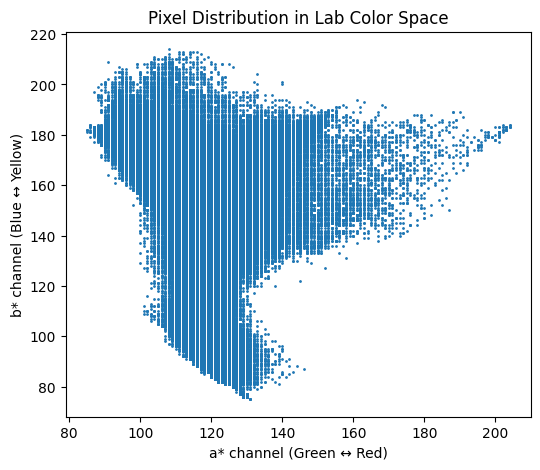

In [889]:
# Distribution of a* and b* channels (Lab color space)
a_channel = pixel_values_4[:,1]
b_channel = pixel_values_4[:,2]

plt.figure(figsize=(6,5))
plt.scatter(a_channel, b_channel, s=1)
plt.xlabel("a* channel (Green ↔ Red)")
plt.ylabel("b* channel (Blue ↔ Yellow)")
plt.title("Pixel Distribution in Lab Color Space")
plt.show()


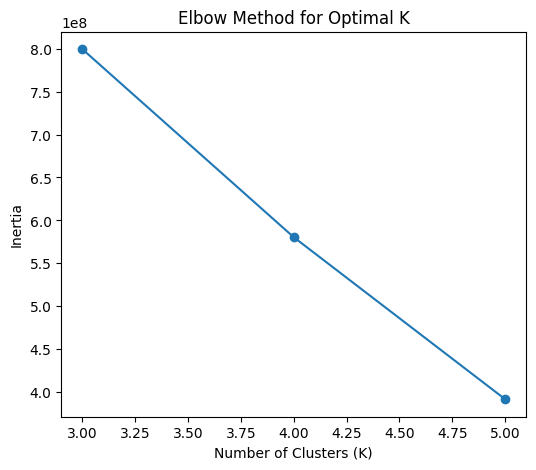

In [890]:
inertia_values_4= []
K_values_4 = [3, 4, 5]

for k in K_values_4:
    kmeans_4 = KMeans(n_clusters=k, random_state=42)
    kmeans_4.fit(pixel_values_4)
    inertia_values_4.append(kmeans_4.inertia_)

plt.figure(figsize=(6,5))
plt.plot(K_values_4, inertia_values_4, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal K")
plt.show()


K = 3, Silhouette Score = 0.5303
K = 4, Silhouette Score = 0.4897
K = 5, Silhouette Score = 0.5123


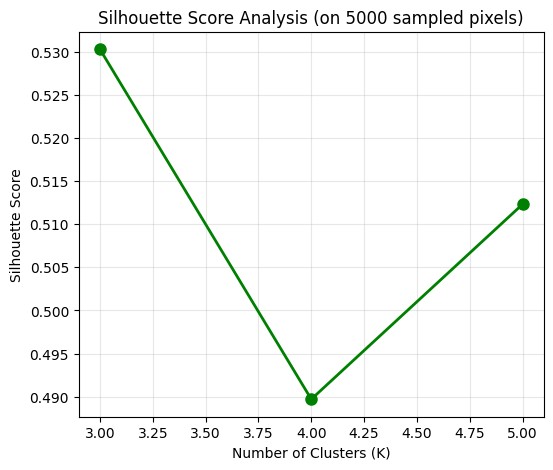

In [891]:
# Sample pixels for faster computation (silhouette score is O(n²) complexity)
sample_size = min(5000, len(pixel_values_4))  # Use 5000 pixels for speed
sample_indices = np.random.choice(len(pixel_values_4), sample_size, replace=False)
pixel_sample = pixel_values_4[sample_indices]

silhouette_scores_4= []

for k in K_values_4:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pixel_sample)
    score = silhouette_score(pixel_sample, labels)
    silhouette_scores_4.append(score)
    print(f"K = {k}, Silhouette Score = {score:.4f}")

plt.figure(figsize=(6,5))
plt.plot(K_values_4, silhouette_scores_4, marker='o', color='green', linewidth=2, markersize=8)
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score Analysis (on 5000 sampled pixels)")
plt.grid(True, alpha=0.3)
plt.show()

In [892]:
results = pd.DataFrame({
    "K": K_values_2,
    "Inertia": inertia_values_2,
    "Silhouette Score": silhouette_scores_2
})

results

,K,Inertia,Silhouette Score
0,3,753866112.0,0.434442
1,4,578834176.0,0.468453
2,5,462321248.0,0.415369


In [893]:
# best K is 4 based on silhouette score
K_optimal = 4
kmeans_opt = KMeans(n_clusters=K_optimal, random_state=42)
labels_opt = kmeans_opt.fit_predict(pixel_values_4)   # pixel_values from Lab image
centers_opt = np.uint8(kmeans_opt.cluster_centers_)

# Map labels to colors
segmented_image_opt = centers_opt[labels_opt]

# Reshape back to original image shape
segmented_image_opt = segmented_image_opt.reshape(image_lab_4.shape)

# Convert Lab back to RGB
segmented_rgb_opt = cv2.cvtColor(np.uint8(segmented_image_opt), cv2.COLOR_LAB2RGB)

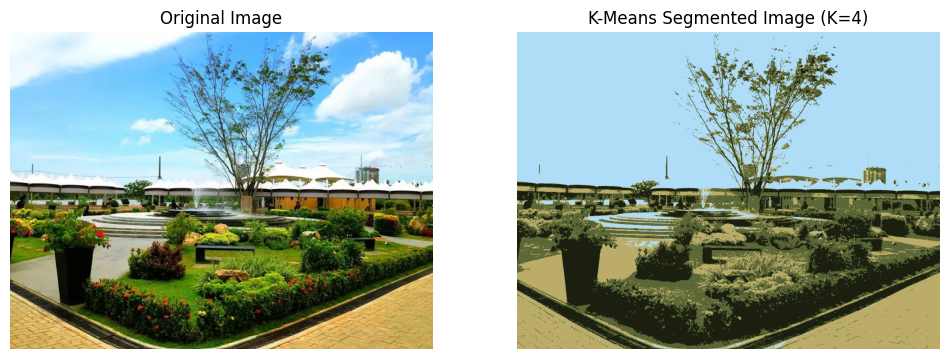

In [894]:
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(image_rgb_4)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(segmented_rgb_opt)
plt.title("K-Means Segmented Image (K=4)")
plt.axis("off")

plt.show()


In [895]:
# Save segmented image
cv2.imwrite("output_img/segmented_diyatha_uyana_k4.jpg", cv2.cvtColor(segmented_rgb_opt, cv2.COLOR_RGB2BGR))

True

In [896]:
# Convert centers to RGB for analysis
centers_rgb = cv2.cvtColor(centers_4.reshape(1, -1, 3), cv2.COLOR_LAB2RGB)
centers_rgb = centers_rgb.reshape(-1, 3)

print("Cluster Centers (RGB):")
for i, c in enumerate(centers_rgb):
    print(f"Cluster {i}: {c}")


Cluster Centers (RGB):
Cluster 0: [207 239 250]
Cluster 1: [26 31 15]
Cluster 2: [115 191 241]
Cluster 3: [ 91 102  50]
Cluster 4: [188 173 105]


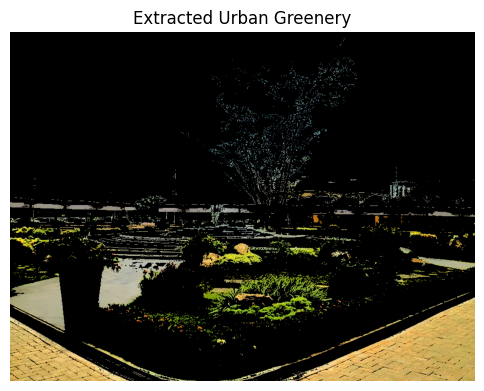

In [897]:
# Create mask for greenery cluster
green_cluster = 2  # change based on visual inspection
mask = (labels_opt == green_cluster)

# Create greenery image
greenery = np.zeros_like(image_rgb_4)
greenery.reshape((-1,3))[mask] = image_rgb_4.reshape((-1,3))[mask]

plt.figure(figsize=(6,6))
plt.imshow(greenery)
plt.title("Extracted Urban Greenery")
plt.axis("off")
plt.show()


In [898]:
# Reshape image into a 2D array of pixels
pixel_values_5 = image_lab_5.reshape((-1, 3))

# Convert to float
pixel_values_5 = np.float32(pixel_values_5)

In [899]:
# Define number of clusters
K = 3

# Apply K-Means
kmeans_5 = KMeans(n_clusters=K, random_state=42)
labels_5 = kmeans_5.fit_predict(pixel_values_5)

# Get cluster centers
centers_5 = np.uint8(kmeans_5.cluster_centers_)

In [900]:
# Define number of clusters
K = 4

# Apply K-Means
kmeans_5 = KMeans(n_clusters=K, random_state=42)
labels_5 = kmeans_5.fit_predict(pixel_values_5)

# Get cluster centers
centers_5 = np.uint8(kmeans_5.cluster_centers_)

In [901]:
# Define number of clusters
K = 5

# Apply K-Means
kmeans_5 = KMeans(n_clusters=K, random_state=42)
labels_5 = kmeans_5.fit_predict(pixel_values_5)

# Get cluster centers
centers_5 = np.uint8(kmeans_5.cluster_centers_)

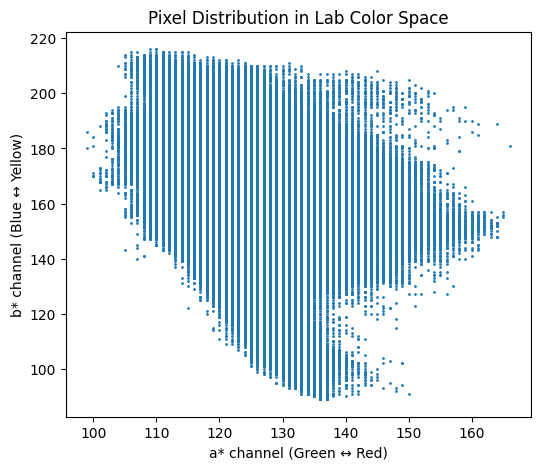

In [902]:
# Distribution of a* and b* channels (Lab color space)
a_channel = pixel_values_5[:,1]
b_channel = pixel_values_5[:,2]

plt.figure(figsize=(6,5))
plt.scatter(a_channel, b_channel, s=1)
plt.xlabel("a* channel (Green ↔ Red)")
plt.ylabel("b* channel (Blue ↔ Yellow)")
plt.title("Pixel Distribution in Lab Color Space")
plt.show()


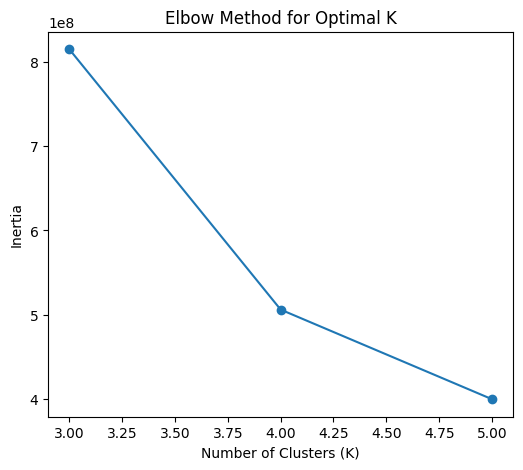

In [903]:
inertia_values_5 = []
K_values_5 = [3, 4, 5]

for k in K_values_5:
    kmeans_5 = KMeans(n_clusters=k, random_state=42)
    kmeans_5.fit(pixel_values_5)
    inertia_values_5.append(kmeans_5.inertia_)

plt.figure(figsize=(6,5))
plt.plot(K_values_5, inertia_values_5, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal K")
plt.show()


K = 3, Silhouette Score = 0.5390
K = 4, Silhouette Score = 0.5217
K = 5, Silhouette Score = 0.4734


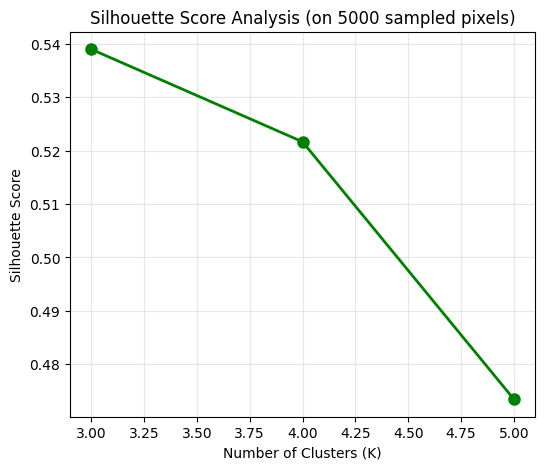

In [904]:
# Sample pixels for faster computation (silhouette score is O(n²) complexity)
sample_size = min(5000, len(pixel_values_5))  # Use 5000 pixels for speed
sample_indices = np.random.choice(len(pixel_values_5), sample_size, replace=False)
pixel_sample = pixel_values_5[sample_indices]

silhouette_scores_5= []

for k in K_values_5:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pixel_sample)
    score = silhouette_score(pixel_sample, labels)
    silhouette_scores_5.append(score)
    print(f"K = {k}, Silhouette Score = {score:.4f}")

plt.figure(figsize=(6,5))
plt.plot(K_values_5, silhouette_scores_5, marker='o', color='green', linewidth=2, markersize=8)
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score Analysis (on 5000 sampled pixels)")
plt.grid(True, alpha=0.3)
plt.show()

In [905]:
results = pd.DataFrame({
    "K": K_values_5,
    "Inertia": inertia_values_5,
    "Silhouette Score": silhouette_scores_5
})

results

,K,Inertia,Silhouette Score
0,3,814954624.0,0.539012
1,4,506173376.0,0.521668
2,5,399898944.0,0.473443


In [906]:
# best K is 3 based on silhouette score
K_optimal = 3
kmeans_opt = KMeans(n_clusters=K_optimal, random_state=42)
labels_opt = kmeans_opt.fit_predict(pixel_values_5)   # pixel_values from Lab image
centers_opt = np.uint8(kmeans_opt.cluster_centers_)

# Map labels to colors
segmented_image_opt = centers_opt[labels_opt]

# Reshape back to original image shape
segmented_image_opt = segmented_image_opt.reshape(image_lab_5.shape)

# Convert Lab back to RGB
segmented_rgb_opt = cv2.cvtColor(np.uint8(segmented_image_opt), cv2.COLOR_LAB2RGB)

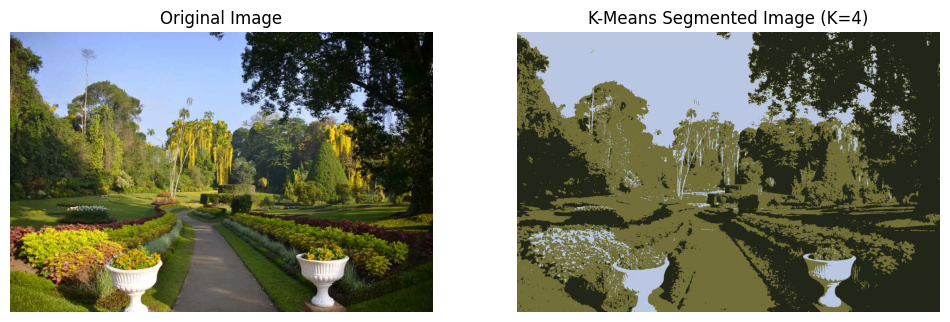

In [907]:
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(image_rgb_5)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(segmented_rgb_opt)
plt.title("K-Means Segmented Image (K=4)")
plt.axis("off")

plt.show()


In [908]:
# Save segmented image
cv2.imwrite("output_img/segmented_peradeniya_garden_k3.jpg", cv2.cvtColor(segmented_rgb_opt, cv2.COLOR_RGB2BGR))

True

In [909]:
# Convert centers to RGB for analysis
centers_rgb = cv2.cvtColor(centers_5.reshape(1, -1, 3), cv2.COLOR_LAB2RGB)
centers_rgb = centers_rgb.reshape(-1, 3)

print("Cluster Centers (RGB):")
for i, c in enumerate(centers_rgb):
    print(f"Cluster {i}: {c}")


Cluster Centers (RGB):
Cluster 0: [106 104  62]
Cluster 1: [176 200 241]
Cluster 2: [21 25 16]
Cluster 3: [166 156  64]
Cluster 4: [58 63 32]


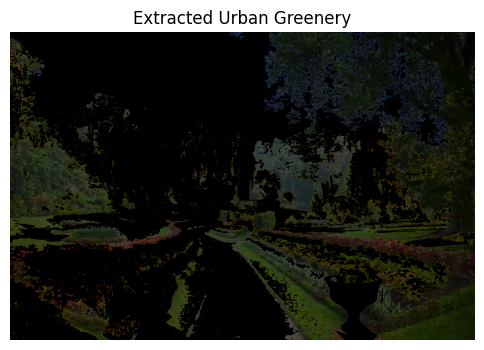

In [910]:
# Create mask for greenery cluster
green_cluster = 2  # change based on visual inspection
mask = (labels_opt == green_cluster)

# Create greenery image
greenery = np.zeros_like(image_rgb_5)
greenery.reshape((-1,3))[mask] = image_rgb_5.reshape((-1,3))[mask]

plt.figure(figsize=(6,6))
plt.imshow(greenery)
plt.title("Extracted Urban Greenery")
plt.axis("off")
plt.show()


In [911]:
# Reshape image into a 2D array of pixels
pixel_values_6 = image_lab_6.reshape((-1, 3))

# Convert to float
pixel_values_6 = np.float32(pixel_values_6)

In [912]:
# Define number of clusters
K = 3

# Apply K-Means
kmeans_6 = KMeans(n_clusters=K, random_state=42)
labels_6 = kmeans_6.fit_predict(pixel_values_6)

# Get cluster centers
centers_6 = np.uint8(kmeans_6.cluster_centers_)

In [913]:
# Define number of clusters
K = 4

# Apply K-Means
kmeans_6 = KMeans(n_clusters=K, random_state=42)
labels_6 = kmeans_6.fit_predict(pixel_values_6)

# Get cluster centers
centers_6 = np.uint8(kmeans_6.cluster_centers_)

In [914]:
# Define number of clusters
K = 5

# Apply K-Means
kmeans_6 = KMeans(n_clusters=K, random_state=42)
labels_6 = kmeans_6.fit_predict(pixel_values_6)

# Get cluster centers
centers_6 = np.uint8(kmeans_6.cluster_centers_)

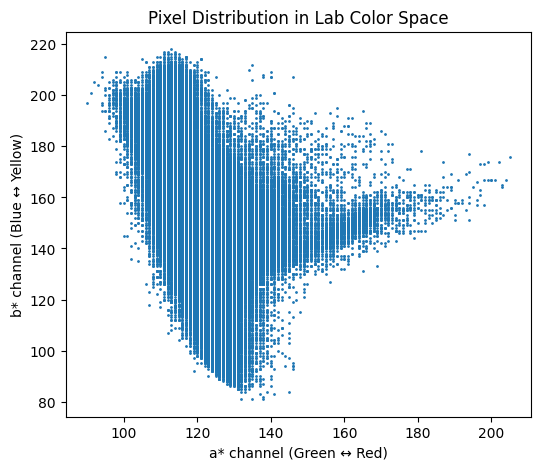

In [915]:
# Distribution of a* and b* channels (Lab color space)
a_channel = pixel_values_6[:,1]
b_channel = pixel_values_6[:,2]

plt.figure(figsize=(6,5))
plt.scatter(a_channel, b_channel, s=1)
plt.xlabel("a* channel (Green ↔ Red)")
plt.ylabel("b* channel (Blue ↔ Yellow)")
plt.title("Pixel Distribution in Lab Color Space")
plt.show()


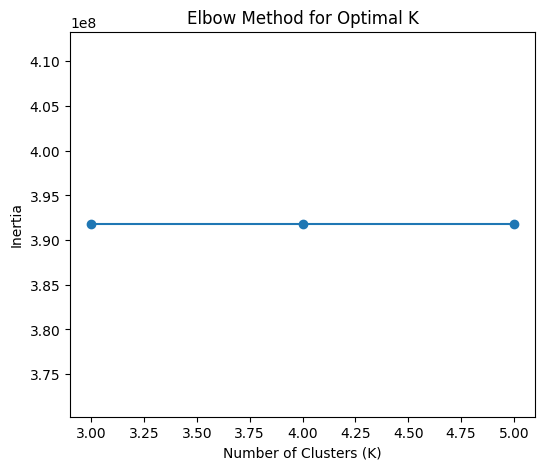

In [916]:
inertia_values_6= []
K_values_6 = [3, 4, 5]

for k in K_values_6:
    kmeans_6 = KMeans(n_clusters=k, random_state=42)
    kmeans_6.fit(pixel_values_6)
    inertia_values_6.append(kmeans_4.inertia_)

plt.figure(figsize=(6,5))
plt.plot(K_values_6, inertia_values_6, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal K")
plt.show()


K = 3, Silhouette Score = 0.5187
K = 4, Silhouette Score = 0.5054
K = 5, Silhouette Score = 0.4895


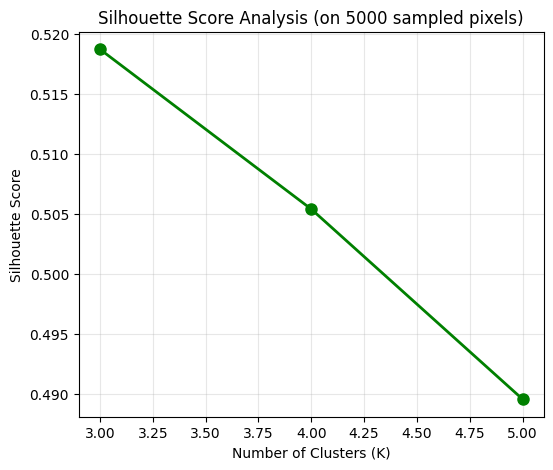

In [917]:
# Sample pixels for faster computation (silhouette score is O(n²) complexity)
sample_size = min(5000, len(pixel_values_6))  # Use 5000 pixels for speed
sample_indices = np.random.choice(len(pixel_values_6), sample_size, replace=False)
pixel_sample = pixel_values_6[sample_indices]

silhouette_scores_6= []

for k in K_values_6:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pixel_sample)
    score = silhouette_score(pixel_sample, labels)
    silhouette_scores_6.append(score)
    print(f"K = {k}, Silhouette Score = {score:.4f}")

plt.figure(figsize=(6,5))
plt.plot(K_values_6, silhouette_scores_6, marker='o', color='green', linewidth=2, markersize=8)
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score Analysis (on 5000 sampled pixels)")
plt.grid(True, alpha=0.3)
plt.show()

In [918]:
results = pd.DataFrame({
    "K": K_values_2,
    "Inertia": inertia_values_2,
    "Silhouette Score": silhouette_scores_2
})

results

,K,Inertia,Silhouette Score
0,3,753866112.0,0.434442
1,4,578834176.0,0.468453
2,5,462321248.0,0.415369


In [919]:
# best K is 4 based on silhouette score
K_optimal = 4
kmeans_opt = KMeans(n_clusters=K_optimal, random_state=42)
labels_opt = kmeans_opt.fit_predict(pixel_values_6)   # pixel_values from Lab image
centers_opt = np.uint8(kmeans_opt.cluster_centers_)

# Map labels to colors
segmented_image_opt = centers_opt[labels_opt]

# Reshape back to original image shape
segmented_image_opt = segmented_image_opt.reshape(image_lab_6.shape)

# Convert Lab back to RGB
segmented_rgb_opt = cv2.cvtColor(np.uint8(segmented_image_opt), cv2.COLOR_LAB2RGB)

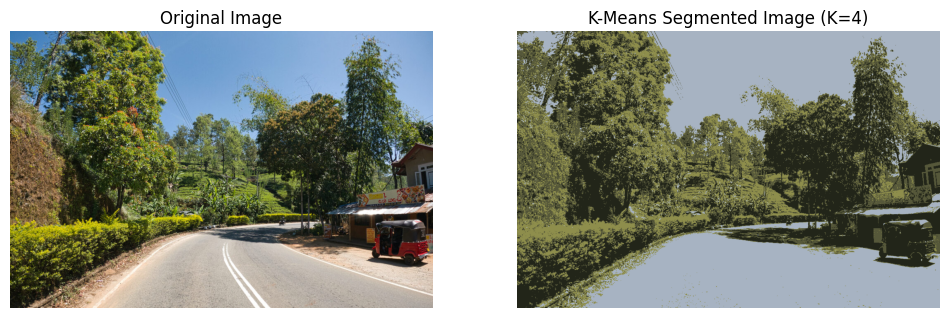

In [920]:
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(image_rgb_6)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(segmented_rgb_opt)
plt.title("K-Means Segmented Image (K=4)")
plt.axis("off")

plt.show()


In [921]:
# Save segmented image
cv2.imwrite("output_img/segmented_road_k4.jpg", cv2.cvtColor(segmented_rgb_opt, cv2.COLOR_RGB2BGR))

True

In [922]:
# Convert centers to RGB for analysis
centers_rgb = cv2.cvtColor(centers_6.reshape(1, -1, 3), cv2.COLOR_LAB2RGB)
centers_rgb = centers_rgb.reshape(-1, 3)

print("Cluster Centers (RGB):")
for i, c in enumerate(centers_rgb):
    print(f"Cluster {i}: {c}")


Cluster Centers (RGB):
Cluster 0: [66 66 42]
Cluster 1: [167 179 194]
Cluster 2: [107 109  75]
Cluster 3: [28 32 22]
Cluster 4: [153 154  73]


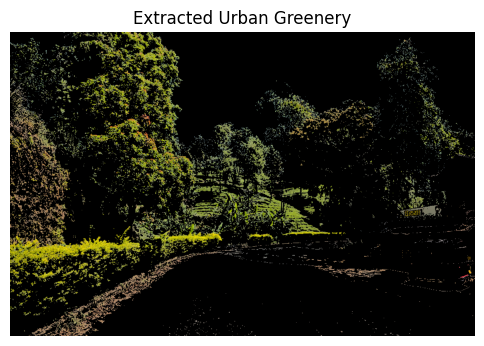

In [923]:
# Create mask for greenery cluster
green_cluster = 2  # change based on visual inspection
mask = (labels_opt == green_cluster)

# Create greenery image
greenery = np.zeros_like(image_rgb_6)
greenery.reshape((-1,3))[mask] = image_rgb_6.reshape((-1,3))[mask]

plt.figure(figsize=(6,6))
plt.imshow(greenery)
plt.title("Extracted Urban Greenery")
plt.axis("off")
plt.show()


In [924]:
# Reshape image into a 2D array of pixels
pixel_values_7 = image_lab_7.reshape((-1, 3))

# Convert to float
pixel_values_7 = np.float32(pixel_values_7)

In [925]:
# Define number of clusters
K = 3

# Apply K-Means
kmeans_7 = KMeans(n_clusters=K, random_state=42)
labels_7 = kmeans_7.fit_predict(pixel_values_7)

# Get cluster centers
centers_7 = np.uint8(kmeans_7.cluster_centers_)

In [926]:
# Define number of clusters
K = 4

# Apply K-Means
kmeans_7 = KMeans(n_clusters=K, random_state=42)
labels_7 = kmeans_7.fit_predict(pixel_values_7)

# Get cluster centers
centers_7 = np.uint8(kmeans_7.cluster_centers_)

In [927]:
# Define number of clusters
K = 5

# Apply K-Means
kmeans_7 = KMeans(n_clusters=K, random_state=42)
labels_7 = kmeans_7.fit_predict(pixel_values_7)

# Get cluster centers
centers_7 = np.uint8(kmeans_7.cluster_centers_)

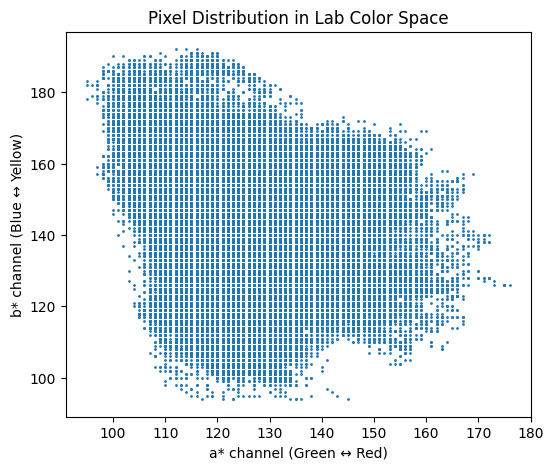

In [928]:
# Distribution of a* and b* channels (Lab color space)
a_channel = pixel_values_7[:,1]
b_channel = pixel_values_7[:,2]

plt.figure(figsize=(6,5))
plt.scatter(a_channel, b_channel, s=1)
plt.xlabel("a* channel (Green ↔ Red)")
plt.ylabel("b* channel (Blue ↔ Yellow)")
plt.title("Pixel Distribution in Lab Color Space")
plt.show()


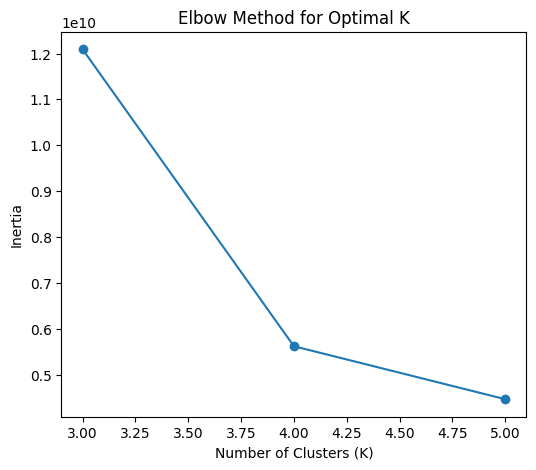

In [929]:
inertia_values_7 = []
K_values_7 = [3, 4, 5]

for k in K_values_7:
    kmeans_7 = KMeans(n_clusters=k, random_state=42)
    kmeans_7.fit(pixel_values_7)
    inertia_values_7.append(kmeans_7.inertia_)

plt.figure(figsize=(6,5))
plt.plot(K_values_7, inertia_values_7, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal K")
plt.show()


K = 3, Silhouette Score = 0.5505
K = 4, Silhouette Score = 0.5790
K = 5, Silhouette Score = 0.5399


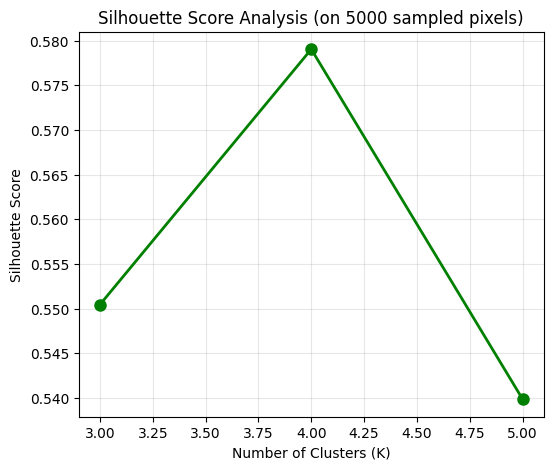

In [930]:
# Sample pixels for faster computation (silhouette score is O(n²) complexity)
sample_size = min(5000, len(pixel_values_7))  # Use 5000 pixels for speed
sample_indices = np.random.choice(len(pixel_values_7), sample_size, replace=False)
pixel_sample = pixel_values_7[sample_indices]

silhouette_scores_7= []
for k in K_values_7:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pixel_sample)
    score = silhouette_score(pixel_sample, labels)
    silhouette_scores_7.append(score)
    print(f"K = {k}, Silhouette Score = {score:.4f}")

plt.figure(figsize=(6,5))
plt.plot(K_values_7, silhouette_scores_7, marker='o', color='green', linewidth=2, markersize=8)
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score Analysis (on 5000 sampled pixels)")
plt.grid(True, alpha=0.3)
plt.show()

In [931]:
results = pd.DataFrame({
    "K": K_values_7,
    "Inertia": inertia_values_7,
    "Silhouette Score": silhouette_scores_7
})

results

,K,Inertia,Silhouette Score
0,3,1.209364e+10,0.550456
1,4,5.618088e+09,0.579043
2,5,4.462625e+09,0.539868


In [932]:
# best K is 4 based on silhouette score
K_optimal = 4
kmeans_opt = KMeans(n_clusters=K_optimal, random_state=42)
labels_opt = kmeans_opt.fit_predict(pixel_values_7)   # pixel_values from Lab image
centers_opt = np.uint8(kmeans_opt.cluster_centers_)

# Map labels to colors
segmented_image_opt = centers_opt[labels_opt]

# Reshape back to original image shape
segmented_image_opt = segmented_image_opt.reshape(image_lab_7.shape)

# Convert Lab back to RGB
segmented_rgb_opt = cv2.cvtColor(np.uint8(segmented_image_opt), cv2.COLOR_LAB2RGB)

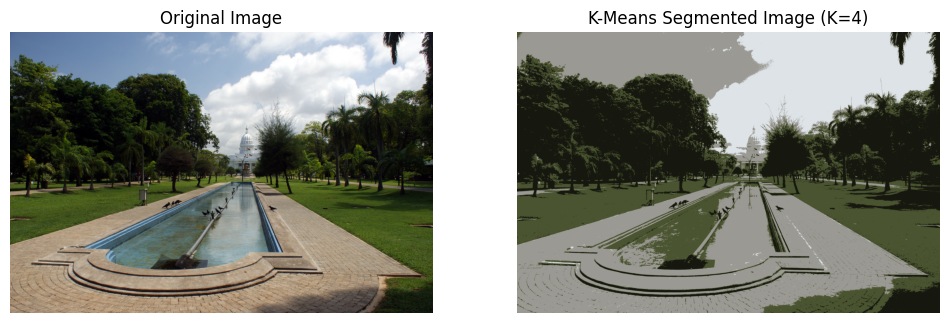

In [933]:
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(image_rgb_7)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(segmented_rgb_opt)
plt.title("K-Means Segmented Image (K=4)")
plt.axis("off")

plt.show()


In [934]:
# Save segmented image
cv2.imwrite("output_img/segmented_viharamahadevi_k4.jpg", cv2.cvtColor(segmented_rgb_opt, cv2.COLOR_RGB2BGR))

True

In [935]:
# Convert centers to RGB for analysis
centers_rgb = cv2.cvtColor(centers_7.reshape(1, -1, 3), cv2.COLOR_LAB2RGB)
centers_rgb = centers_rgb.reshape(-1, 3)

print("Cluster Centers (RGB):")
for i, c in enumerate(centers_rgb):
    print(f"Cluster {i}: {c}")


Cluster Centers (RGB):
Cluster 0: [22 24 15]
Cluster 1: [169 160 147]
Cluster 2: [222 228 232]
Cluster 3: [71 82 42]
Cluster 4: [115 128 140]


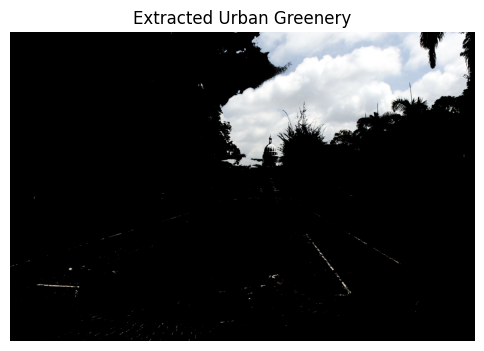

In [ ]:
# Create mask for greenery cluster
green_cluster = 1  # change based on visual inspection
mask = (labels_opt == green_cluster)

# Create greenery image
greenery = np.zeros_like(image_rgb_7)
greenery.reshape((-1,3))[mask] = image_rgb_7.reshape((-1,3))[mask]

plt.figure(figsize=(6,6))
plt.imshow(greenery)
plt.title("Extracted Urban Greenery")
plt.axis("off")
plt.show()
